In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sn
%matplotlib inline
from matplotlib.image import imread
import cv2
import random
from os import listdir
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import classification_report

from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array,array_to_img
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation,Flatten, Dense, Dropout, LeakyReLU
from tensorflow.math import confusion_matrix
from tensorflow.keras import callbacks
from tensorflow.keras.models import load_model

2024-02-20 18:01:51.908076: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-20 18:01:51.908200: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-20 18:01:52.040654: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
path=listdir('/dataset/buildings')

path

['22735.jpg',
 '22706.jpg',
 '20777.jpg',
 '23220.jpg',
 '21232.jpg',
 '20874.jpg',
 '24083.jpg',
 '23776.jpg',
 '22860.jpg',
 '20061.jpg',
 '21706.jpg',
 '23527.jpg',
 '24258.jpg',
 '20436.jpg',
 '23854.jpg',
 '22267.jpg',
 '21319.jpg',
 '21841.jpg',
 '21680.jpg',
 '23009.jpg',
 '20637.jpg',
 '20096.jpg',
 '24053.jpg',
 '22410.jpg',
 '20733.jpg',
 '22227.jpg',
 '21501.jpg',
 '21386.jpg',
 '22296.jpg',
 '22462.jpg',
 '20981.jpg',
 '23726.jpg',
 '20246.jpg',
 '21066.jpg',
 '20425.jpg',
 '21580.jpg',
 '20546.jpg',
 '21233.jpg',
 '20580.jpg',
 '20294.jpg',
 '20646.jpg',
 '20228.jpg',
 '23359.jpg',
 '21309.jpg',
 '23297.jpg',
 '22911.jpg',
 '21182.jpg',
 '21243.jpg',
 '22784.jpg',
 '21387.jpg',
 '21367.jpg',
 '23385.jpg',
 '22995.jpg',
 '20904.jpg',
 '22255.jpg',
 '24010.jpg',
 '24197.jpg',
 '23012.jpg',
 '21158.jpg',
 '20515.jpg',
 '22448.jpg',
 '23604.jpg',
 '22076.jpg',
 '21294.jpg',
 '22257.jpg',
 '23908.jpg',
 '20431.jpg',
 '23304.jpg',
 '22759.jpg',
 '22534.jpg',
 '20574.jpg',
 '2340

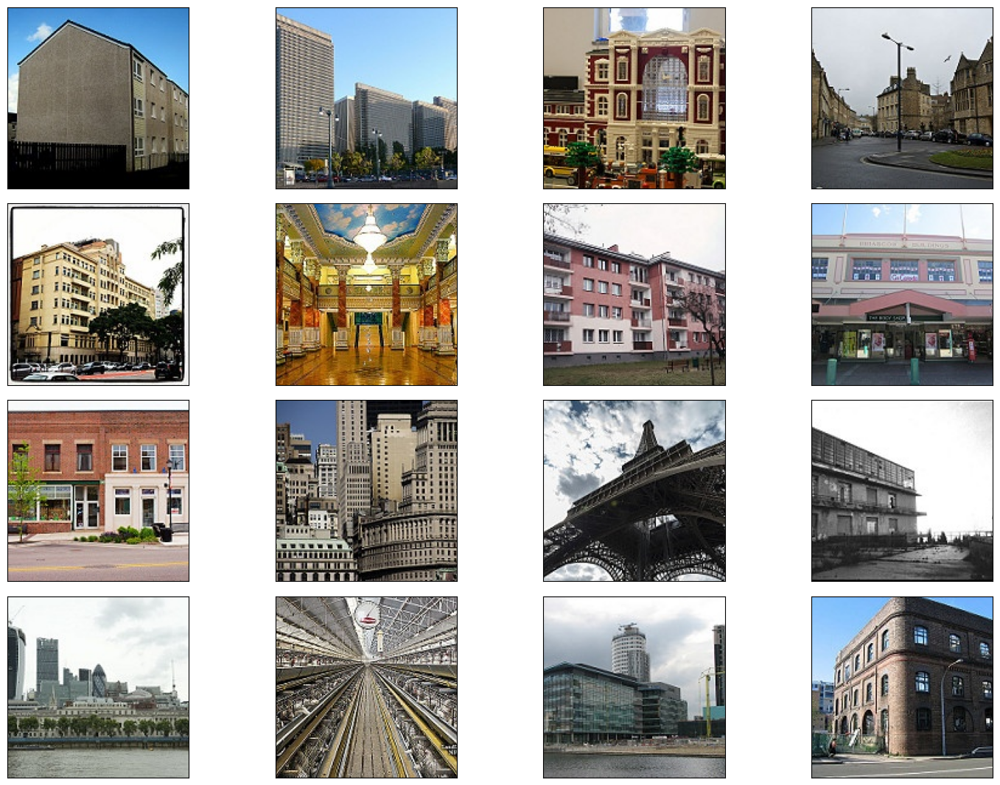

In [ ]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/dataset/buildings'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

In [4]:
print(f"Buildings Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Buildings Images shape is: 150*150 Pixels


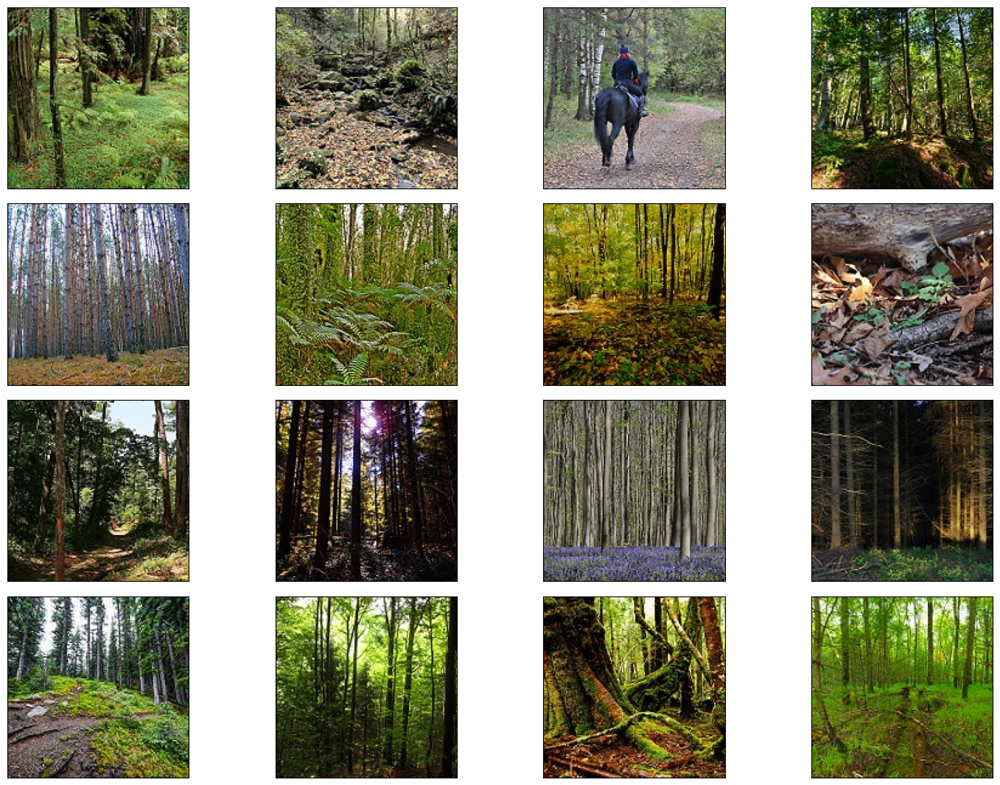

In [5]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/dataset/forest'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

In [6]:
print(f"Forest Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Forest Images shape is: 150*150 Pixels


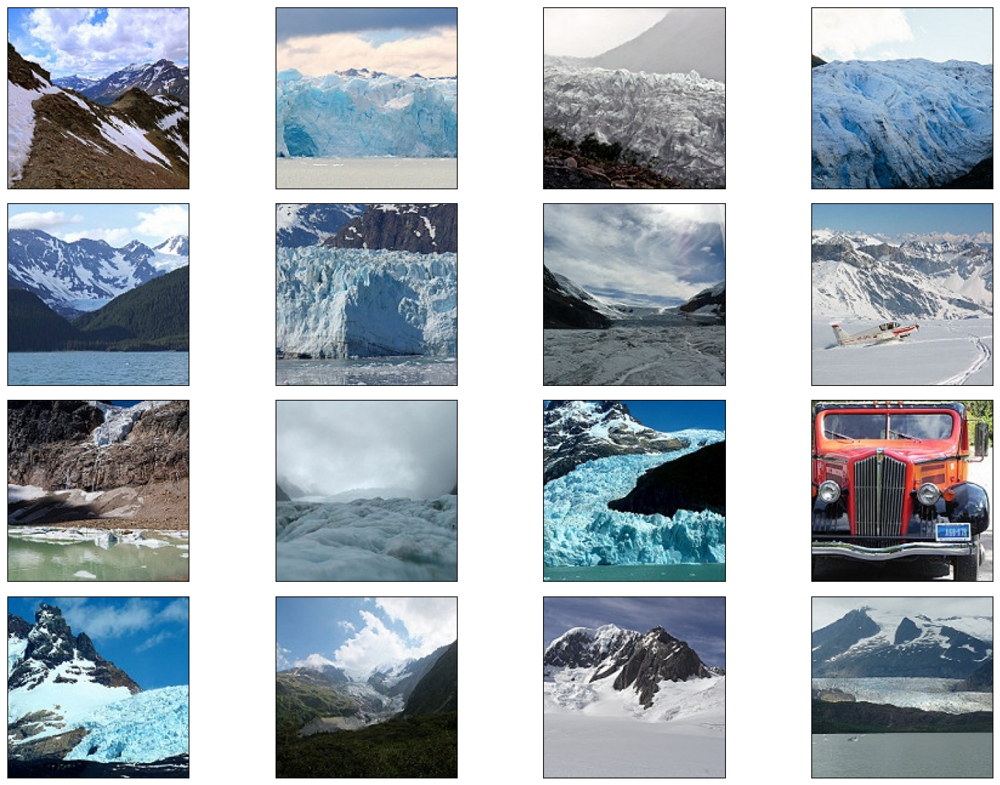

In [7]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/dataset/glacier'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

In [8]:
print(f"Glaciers Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Glaciers Images shape is: 150*150 Pixels


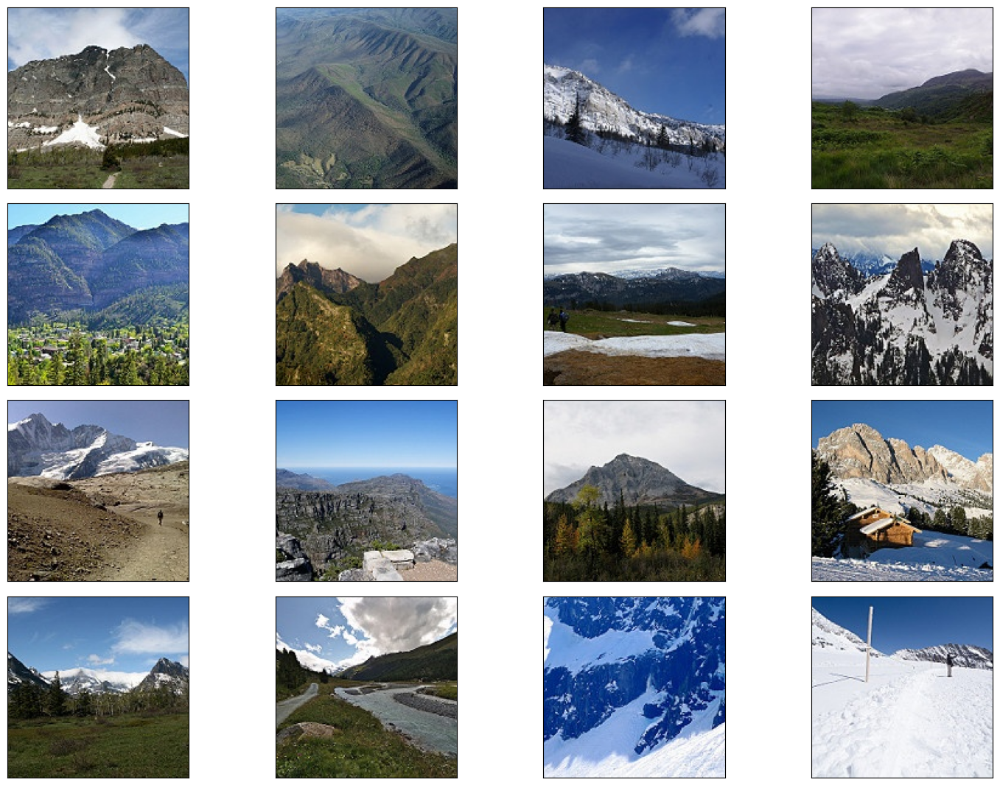

In [9]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/dataset/mountain'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

**Shape**

In [10]:
print(f"Mountains Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Mountains Images shape is: 150*150 Pixels


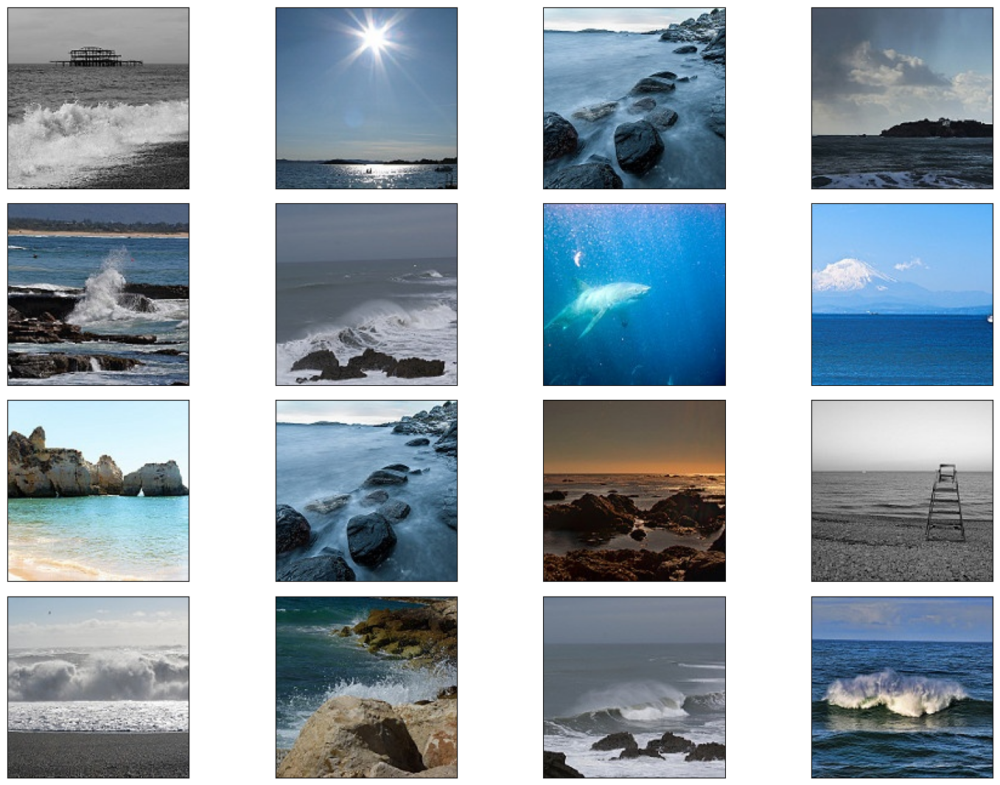

In [11]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/dataset/sea'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

In [12]:
print(f"Sea Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Sea Images shape is: 150*150 Pixels


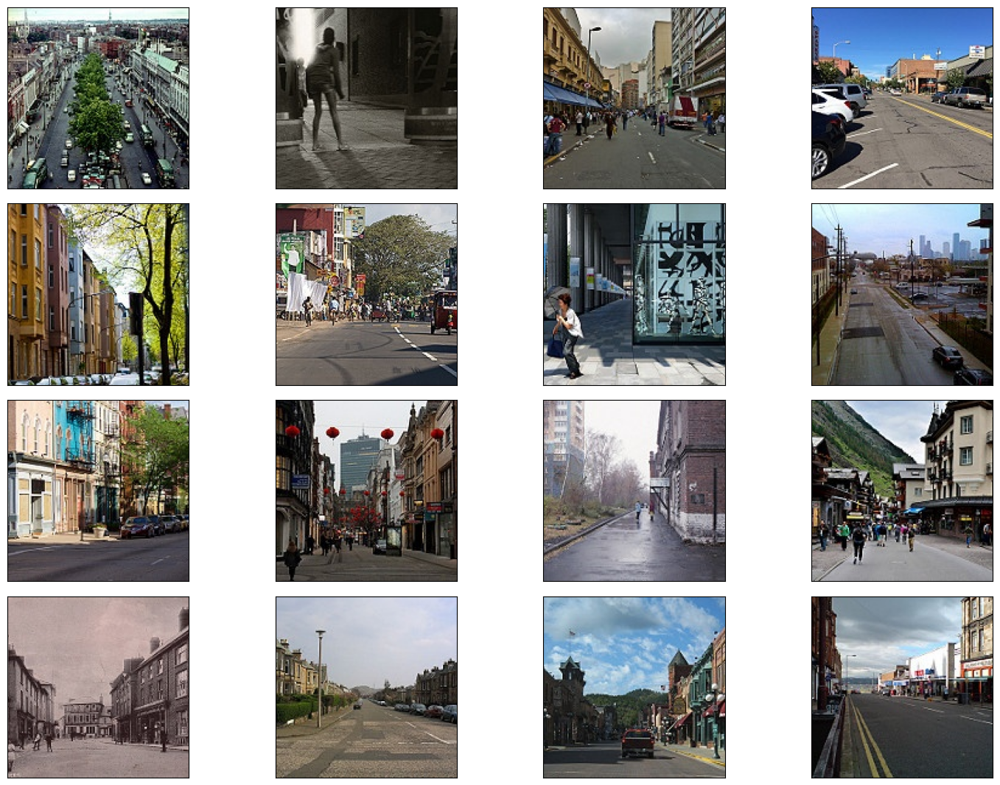

In [ ]:
# PLotting 16 random images

plt.figure(figsize=(15,11))
path='/dataset/street'

for i in range(1,17):
    plt.subplot(4,4, i)
    plt.tight_layout()
    rand_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(rand_img)
    plt.xticks([])
    plt.yticks([])

In [14]:
print(f"Streets Images shape is: {rand_img.shape[0]}*{rand_img.shape[1]} Pixels")

Streets Images shape is: 150*150 Pixels


# Setting root directory and creating empty list

In [15]:
dir="/dataset"
root_dir=listdir(dir)
image_list, label_list=[], []

In [16]:
root_dir

['mountain', 'street', 'buildings', 'sea', 'forest', 'glacier']

# Reading and Converting image to numpy array

In [17]:
for directory in root_dir:
    for files in listdir(f"{dir}/{directory}"):
        image_path=f"{dir}/{directory}/{files}"
        
        image=Image.open(image_path)
        image=image.resize((150,150))
        image=img_to_array(image)
        image_list.append(image)
        label_list.append(directory)

In [ ]:
image_list[0]

array([[[130., 145., 186.],
        [131., 146., 187.],
        [132., 147., 188.],
        ...,
        [118., 140., 189.],
        [120., 142., 191.],
        [121., 143., 192.]],

       [[131., 146., 187.],
        [131., 146., 187.],
        [133., 148., 189.],
        ...,
        [118., 140., 189.],
        [120., 142., 191.],
        [121., 143., 192.]],

       [[130., 145., 186.],
        [131., 146., 187.],
        [130., 148., 188.],
        ...,
        [120., 142., 191.],
        [119., 141., 190.],
        [119., 141., 190.]],

       ...,

       [[ 77.,  74.,  41.],
        [ 25.,  23.,   0.],
        [100.,  97.,  56.],
        ...,
        [ 79.,  75.,  37.],
        [ 87.,  84.,  43.],
        [ 84.,  81.,  40.]],

       [[ 43.,  42.,  11.],
        [ 57.,  54.,  19.],
        [ 84.,  81.,  40.],
        ...,
        [ 74.,  69.,  29.],
        [112., 107.,  67.],
        [ 78.,  73.,  33.]],

       [[ 26.,  25.,   0.],
        [ 72.,  72.,  36.],
        [ 93.,  

In [19]:
print(f"Our data contains {len(image_list)} images with different classes")

Our data contains 3000 images with different classes


# Labeled List analysis

In [20]:
label_counts=pd.DataFrame(label_list).value_counts()
label_counts

0        
glacier      553
mountain     525
sea          510
street       501
forest       474
buildings    437
Name: count, dtype: int64

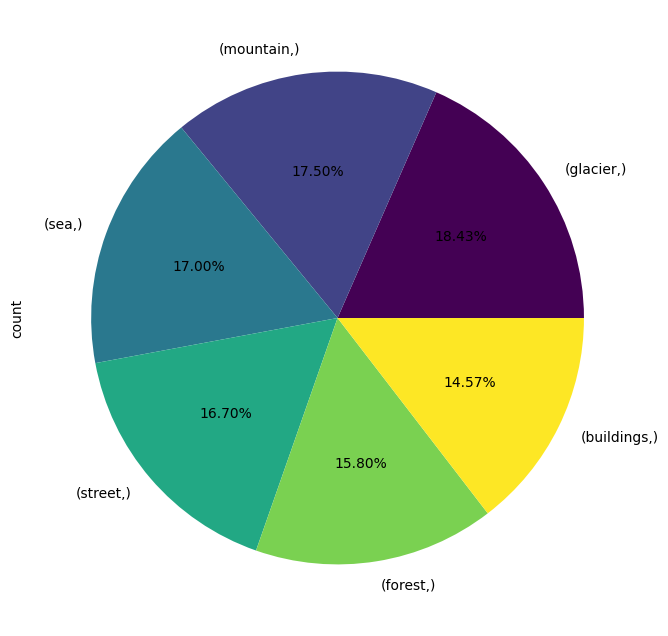

In [21]:
cmap = plt.get_cmap('viridis')

colors = cmap(np.linspace(0, 1, len(label_counts)))

plt.figure(figsize=(10,8))
label_counts.plot(kind='pie', autopct="%1.2f%%", colors=colors)
plt.show()

In [22]:
num_classes=len(label_counts)

num_classes

6

In [23]:
np.array(image_list).shape

(3000, 150, 150, 3)

In [24]:
label_list=np.array(label_list)
label_list.shape

(3000,)

# Splitting the data into Training and Testing

In [25]:
X_train,X_test,Y_train,Y_test=train_test_split(image_list, label_list, test_size=0.2, random_state=10)

In [26]:
print(f"Number of Training dataset: {len(X_train)}")
print(f"Number of Testing dataset: {len(X_test)}")

Number of Training dataset: 2400
Number of Testing dataset: 600


# Normalize and reshape the data

In [27]:
X_train=np.array(X_train, dtype=np.float16)/ 255.0
X_test=np.array(X_test, dtype=np.float16)/ 255.0

X_train=X_train.reshape(-1, 150,150,3)
X_test=X_test.reshape(-1, 150,150,3)

In [28]:
X_train[0]

array([[[0.7295, 0.8   , 0.8   ],
        [0.7295, 0.8   , 0.8   ],
        [0.7295, 0.8   , 0.8   ],
        ...,
        [0.792 , 0.851 , 0.8394],
        [0.792 , 0.851 , 0.8394],
        [0.792 , 0.851 , 0.8394]],

       [[0.7295, 0.8   , 0.8   ],
        [0.7295, 0.8   , 0.8   ],
        [0.7295, 0.8   , 0.8   ],
        ...,
        [0.788 , 0.847 , 0.8354],
        [0.788 , 0.847 , 0.8354],
        [0.788 , 0.847 , 0.8354]],

       [[0.7334, 0.8037, 0.8037],
        [0.7334, 0.8037, 0.8037],
        [0.7334, 0.8037, 0.8037],
        ...,
        [0.784 , 0.8433, 0.8315],
        [0.788 , 0.847 , 0.8354],
        [0.788 , 0.847 , 0.8354]],

       ...,

       [[0.1686, 0.1726, 0.149 ],
        [0.2079, 0.2118, 0.1882],
        [0.1765, 0.1882, 0.1608],
        ...,
        [0.1608, 0.1882, 0.1569],
        [0.1726, 0.2   , 0.1726],
        [0.1569, 0.1843, 0.1569]],

       [[0.1686, 0.1726, 0.149 ],
        [0.2235, 0.2274, 0.204 ],
        [0.1843, 0.196 , 0.1686],
        .

# Label Binarizing

In [29]:
lb=LabelBinarizer()
Y_train=lb.fit_transform(Y_train)
Y_test=lb.fit_transform(Y_test)

print(lb.classes_)

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']


In [30]:
Y_train[0]

array([0, 0, 1, 0, 0, 0])

# splitting training data as Train and Validation data

In [31]:
# Training data 80% and validation data 20%
X_train,X_val, Y_train,Y_val=train_test_split(X_train, Y_train, test_size=0.2)

In [32]:
print(f"Number of Training dataset: {len(X_train)}\nNumber of Testing dataset: {len(X_test)}\nNumber of Validation dataset: {len(X_val)}")

Number of Training dataset: 1920
Number of Testing dataset: 600
Number of Validation dataset: 480


##  CNN - model 
# Building

In [38]:
cnn_model=Sequential([
    
    Conv2D(16, kernel_size=(3,3), input_shape=(150,150,3)),
    LeakyReLU(),
    
    Conv2D(32, kernel_size=(3,3)),
    LeakyReLU(),
    MaxPooling2D(5,5),
    
    Conv2D(64, kernel_size=(3,3)),
    LeakyReLU(),
    
    Conv2D(128, kernel_size=(3,3), input_shape=(150,150,3)),
    LeakyReLU(),
    MaxPooling2D(5,5),
    
    Flatten(),
    
    Dense(64),
    Dropout(rate=0.2),
    LeakyReLU(),
    
    Dense(32),
    Dropout(rate=0.2),
    LeakyReLU(),
    
    Dense(16),
    Dropout(rate=0.2),
    LeakyReLU(1),
    
    Dense(num_classes, activation='softmax')
])

cnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 16)      448       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 148, 148, 16)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 146, 146, 32)      4640      
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 146, 146, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 29, 29, 32)        0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 27, 27, 64)        18496     
                                                      

## Compile and train CNN Model

In [39]:
# Compiling the cnn_model
cnn_model.compile(
    optimizer=Adam(learning_rate=0.0005),
        loss='categorical_crossentropy',
        metrics=['acc'])

epochs=1000
batch_size=128

mc=callbacks.ModelCheckpoint('best_model.h5', monitor='val_loss',mode='min',patience=10, save_best_only=True)


## Prune to overfit
early_stopping=callbacks.EarlyStopping(
    patience=10,
    min_delta=0,
    monitor='val_loss',
    restore_best_weights=True,
    verbose=0,
    mode='min',
    baseline=None,
)

plateau=callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=4,
    verbose=0,
    mode='min'
)


# Train the Model
history=cnn_model.fit(X_train, Y_train, batch_size=batch_size,epochs=epochs, validation_data=(X_val,Y_val),
                     callbacks=[early_stopping, plateau, mc])

Epoch 1/1000
15/15 [==============================] - 9s 159ms/step - loss: 1.6174 - acc: 0.3187 - val_loss: 1.4094 - val_acc: 0.4187 - lr: 5.0000e-04
Epoch 2/1000
 2/15 [===>..........................] - ETA: 0s - loss: 1.3285 - acc: 0.4688

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


15/15 [==============================] - 1s 69ms/step - loss: 1.3417 - acc: 0.4510 - val_loss: 1.2683 - val_acc: 0.4812 - lr: 5.0000e-04
Epoch 3/1000
15/15 [==============================] - 1s 69ms/step - loss: 1.2313 - acc: 0.5031 - val_loss: 1.1133 - val_acc: 0.5562 - lr: 5.0000e-04
Epoch 4/1000
15/15 [==============================] - 1s 69ms/step - loss: 1.1248 - acc: 0.5448 - val_loss: 1.0427 - val_acc: 0.6083 - lr: 5.0000e-04
Epoch 5/1000
15/15 [==============================] - 1s 69ms/step - loss: 1.0918 - acc: 0.5740 - val_loss: 1.0258 - val_acc: 0.5917 - lr: 5.0000e-04
Epoch 6/1000
15/15 [==============================] - 1s 68ms/step - loss: 1.0342 - acc: 0.5792 - val_loss: 0.9426 - val_acc: 0.6521 - lr: 5.0000e-04
Epoch 7/1000
15/15 [==============================] - 1s 69ms/step - loss: 0.9818 - acc: 0.6068 - val_loss: 0.8803 - val_acc: 0.6771 - lr: 5.0000e-04
Epoch 8/1000
15/15 [==============================] - 1s 69ms/step - loss: 0.9218 - acc: 0.6333 - val_loss: 0.876

### CNN Model Accuracy on Validation data

In [40]:
cnn_model.evaluate(X_val,Y_val)

15/15 [==============================] - 0s 9ms/step - loss: 0.7353 - acc: 0.7646


[0.7353431582450867, 0.7645833492279053]

###  CNN Model Accuracy on Testing data

In [41]:
cnn_model.evaluate(X_test,Y_test)

19/19 [==============================] - 0s 23ms/step - loss: 0.8235 - acc: 0.7050


[0.8234993815422058, 0.7049999833106995]

#  Learning Curve

# Loss

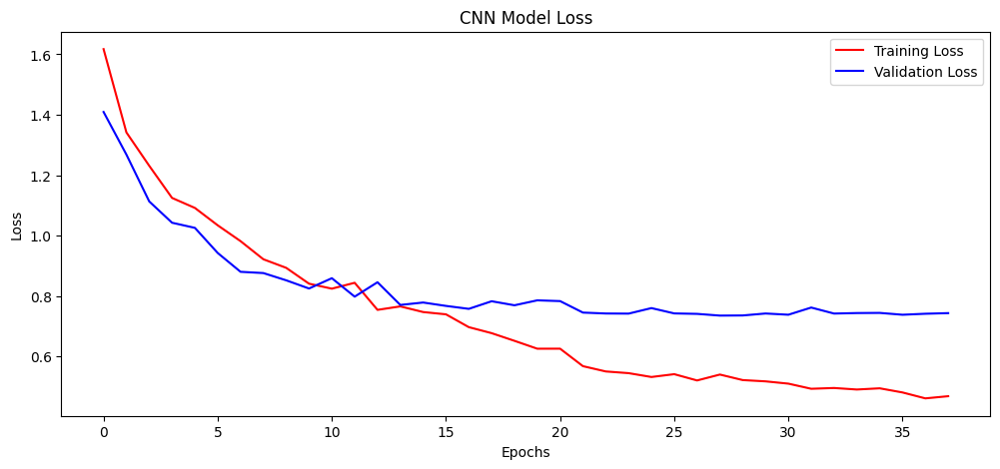

In [42]:
plt.figure(figsize=(12,5))

plt.plot(history.history['loss'], label='Training Loss', color='r')
plt.plot(history.history['val_loss'], label='Validation Loss', color='b')

plt.title("CNN Model Loss")
plt.xlabel('Epochs')
plt.ylabel("Loss")
plt.legend()
plt.show()

# Accuracy

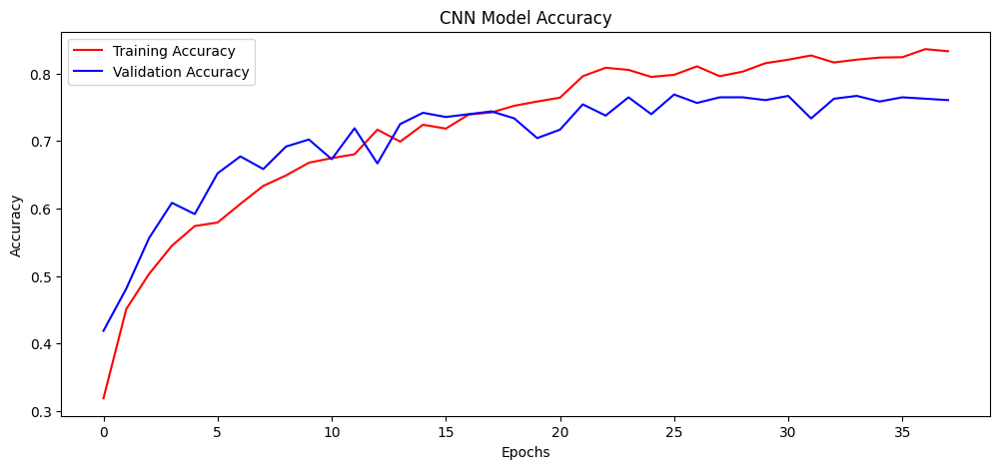

In [43]:
plt.figure(figsize=(12,5))

plt.plot(history.history['acc'], label='Training Accuracy', color='r')
plt.plot(history.history['val_acc'], label='Validation Accuracy', color='b')

plt.title("CNN Model Accuracy")
plt.xlabel('Epochs')
plt.ylabel("Accuracy")
plt.legend()
plt.show()

--------------------------------------------------------------------------------------------------------------------

# Prediction

In [44]:
y_pred=cnn_model.predict(X_test)

19/19 [==============================] - 0s 7ms/step


In [45]:
y_pred

array([[8.67004227e-03, 9.33377771e-04, 2.61851966e-01, 1.60338551e-01,
        5.66857815e-01, 1.34815008e-03],
       [1.92885362e-02, 4.26973542e-03, 6.58064708e-02, 7.58595467e-01,
        1.51584119e-01, 4.55722737e-04],
       [3.73310298e-01, 1.13818352e-03, 1.44956201e-01, 1.58761814e-01,
        3.12277585e-01, 9.55595914e-03],
       ...,
       [2.33622879e-01, 2.98955798e-01, 2.78628077e-02, 3.55850607e-02,
        1.16022736e-01, 2.87950724e-01],
       [1.62348431e-02, 9.90374130e-04, 6.36901557e-01, 1.00280456e-01,
        2.39375666e-01, 6.21710578e-03],
       [6.57494413e-03, 1.00674527e-03, 4.71435525e-02, 6.35596693e-01,
        3.09097648e-01, 5.80360240e-04]], dtype=float32)

In [46]:
y_pred.shape

(600, 6)

Predicted

In [47]:
np.argmax(y_pred[10])

3

Original

In [48]:
np.argmax(Y_test[10])

3

 #Evaluation

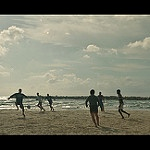

In [49]:
img=array_to_img(X_test[5])
img

In [50]:
labels=lb.classes_
print(labels)

print('Originally: ',labels[np.argmax(Y_test[5])])
print('Predicted: ',labels[np.argmax(y_pred[5])])

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']
Originally:  sea
Predicted:  sea


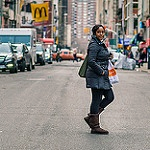

In [51]:
img=array_to_img(X_test[50])
img

In [52]:
labels=lb.classes_
print(labels)

print('Originally: ',labels[np.argmax(Y_test[50])])
print('Predicted: ',labels[np.argmax(y_pred[50])])

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']
Originally:  street
Predicted:  street


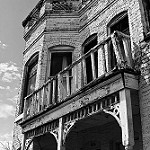

In [53]:
img=array_to_img(X_test[99])
img

In [54]:
labels=lb.classes_
print(labels)

print('Originally: ',labels[np.argmax(Y_test[99])])
print('Predicted: ',labels[np.argmax(y_pred[99])])

['buildings' 'forest' 'glacier' 'mountain' 'sea' 'street']
Originally:  buildings
Predicted:  buildings
